In [1]:
# Mengelompokkan karakteristik gempa berdasarkan parameter seperti magnitudo dan kedalaman menggunakan algoritma machine learning (K-Means dan DBSCAN).

In [5]:
#⚙️ 1. Load & Preprocessing

import pandas as pd
from sklearn.preprocessing import StandardScaler

# Load data
df = pd.read_csv("seismic_gap_features.csv")

# Ambil fitur untuk clustering
fitur = df[['mag', 'depth', 'latitude', 'longitude']].copy()

# Normalisasi
scaler = StandardScaler()
fitur_scaled = scaler.fit_transform(fitur)


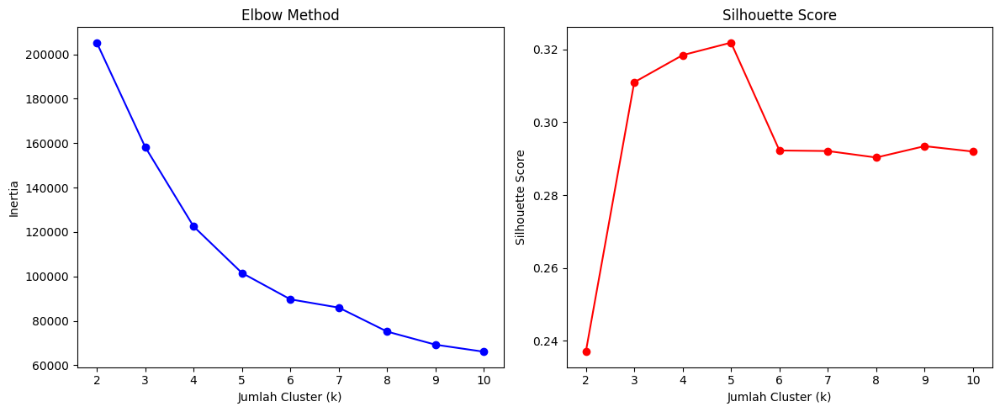

In [6]:
#📉 2. Elbow Method & Silhouette Score

from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score
import matplotlib.pyplot as plt

inertia = []
silhouette_scores = []
K = range(2, 11)

for k in K:
    kmeans = KMeans(n_clusters=k, random_state=42)
    labels = kmeans.fit_predict(fitur_scaled)
    inertia.append(kmeans.inertia_)
    silhouette_scores.append(silhouette_score(fitur_scaled, labels))

# Plot Elbow
plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.plot(K, inertia, 'bo-')
plt.xlabel('Jumlah Cluster (k)')
plt.ylabel('Inertia')
plt.title('Elbow Method')

# Plot Silhouette
plt.subplot(1, 2, 2)
plt.plot(K, silhouette_scores, 'ro-')
plt.xlabel('Jumlah Cluster (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Score')
plt.tight_layout()
plt.show()


In [9]:
#✅ 3. Pilih k Optimal & Lakukan Clustering

k_optimal = 5
kmeans = KMeans(n_clusters=k_optimal, random_state=42)
df['cluster'] = kmeans.fit_predict(fitur_scaled)



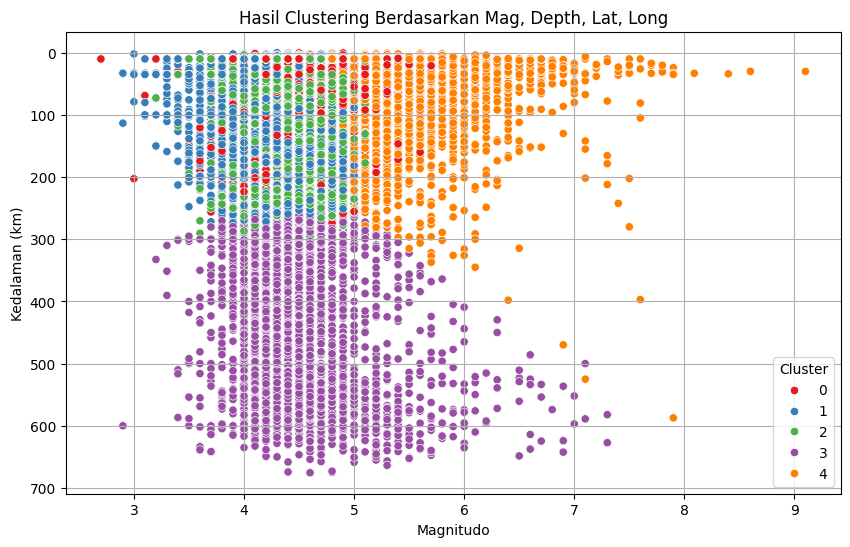

In [10]:
#📊 4. Visualisasi Clustering (Magnitudo vs Kedalaman)


import seaborn as sns

plt.figure(figsize=(10, 6))
sns.scatterplot(x='mag', y='depth', hue='cluster', data=df, palette='Set1')
plt.gca().invert_yaxis()
plt.title('Hasil Clustering Berdasarkan Mag, Depth, Lat, Long')
plt.xlabel('Magnitudo')
plt.ylabel('Kedalaman (km)')
plt.legend(title='Cluster')
plt.grid(True)
plt.show()


In [11]:
#save

df.to_csv("seismic_gap_features_clustered.csv", index=False)


visualisasi

In [18]:
import pandas as pd
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
import plotly.express as px

# Load file hasil clustering
df = pd.read_csv("seismic_gap_features_clustered.csv")

# Ambil fitur utama
fitur = df[['mag', 'depth', 'latitude', 'longitude']]
labels = df['cluster'].astype(str)

# Standardisasi
scaler = StandardScaler()
fitur_scaled = scaler.fit_transform(fitur)

# PCA ke 3 dimensi
pca = PCA(n_components=3)
fitur_pca = pca.fit_transform(fitur_scaled)

# Gabungkan dengan info asli
pca_df = pd.DataFrame(fitur_pca, columns=['PC1', 'PC2', 'PC3'])
pca_df['cluster'] = labels
pca_df['mag'] = df['mag']
pca_df['depth'] = df['depth']
pca_df['lat'] = df['latitude']
pca_df['lon'] = df['longitude']

# Visualisasi dengan plotly
fig = px.scatter_3d(
    pca_df, x='PC1', y='PC2', z='PC3', color='cluster',
    size='mag',  # ukuran titik berdasarkan magnitudo
    hover_data=['mag', 'depth', 'lat', 'lon', 'cluster'],
    title='🌍 Visualisasi Clustering Gempa dalam 3D PCA (4D Features)',
    opacity=0.8,
    color_discrete_sequence=px.colors.qualitative.Set2
)

# Perindah tampilan
fig.update_layout(
    width=1200,   # Lebar dalam piksel
    height=700,   # Tinggi dalam piksel
    scene=dict(
        xaxis_title='PC1',
        yaxis_title='PC2',
        zaxis_title='PC3',
        camera=dict(eye=dict(x=1.6, y=1.6, z=1.2))
    ),
    title_font=dict(size=22),
    legend_title_text='Cluster'
)


fig.show()
